# Feature Extraction
### Aprendizaje no supervisado para generar representaciones eficientes de los datos

Ejemplo por **Ricardo Mansilla**.

En este notebook vamos a usar el (Mushroom Classification)[https://www.kaggle.com/uciml/mushroom-classification]
dataset. Se trata de predecir si un hongo es venenoso por determinados features.

Intentaremos y compararemos distintos metodos para extraer features y medir su capacidad predictiva.

## Preparando los datos

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
import time
import os


In [2]:
df = pd.read_csv('mushrooms.csv')
pd.options.display.max_columns = None
df.head()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,e,e,s,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,e,c,s,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,e,c,s,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,e,e,s,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,t,e,s,s,w,w,p,w,o,e,n,a,g


In [3]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_values = pd.DataFrame({'percent_missing': percent_missing})
missing_values.sort_values(by ='percent_missing' , ascending=False)

,percent_missing
class,0.0
stalk-surface-above-ring,0.0
population,0.0
spore-print-color,0.0
ring-type,0.0
ring-number,0.0
veil-color,0.0
veil-type,0.0
stalk-color-below-ring,0.0
stalk-color-above-ring,0.0


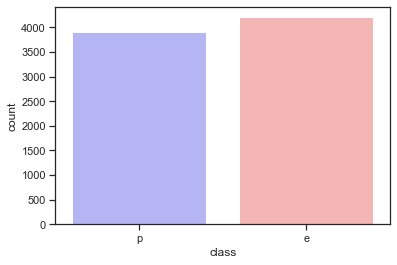

In [4]:
sns.set(style="ticks")
f = sns.countplot(x="class", data=df, palette="bwr")
plt.show()

In [5]:
df['class'].value_counts()

e    4208
p    3916
Name: class, dtype: int64

In [6]:
X = df.drop(['class'], axis = 1)
Y = df['class']

In [7]:
X = pd.get_dummies(X, prefix_sep='_')
X.head()

,cap-shape_b,cap-shape_c,cap-shape_f,cap-shape_k,cap-shape_s,cap-shape_x,cap-surface_f,cap-surface_g,cap-surface_s,cap-surface_y,cap-color_b,cap-color_c,cap-color_e,cap-color_g,cap-color_n,cap-color_p,cap-color_r,cap-color_u,cap-color_w,cap-color_y,bruises_f,bruises_t,odor_a,odor_c,odor_f,odor_l,odor_m,odor_n,odor_p,odor_s,odor_y,gill-attachment_a,gill-attachment_f,gill-spacing_c,gill-spacing_w,gill-size_b,gill-size_n,gill-color_b,gill-color_e,gill-color_g,gill-color_h,gill-color_k,gill-color_n,gill-color_o,gill-color_p,gill-color_r,gill-color_u,gill-color_w,gill-color_y,stalk-shape_e,stalk-shape_t,stalk-root_?,stalk-root_b,stalk-root_c,stalk-root_e,stalk-root_r,stalk-surface-above-ring_f,stalk-surface-above-ring_k,stalk-surface-above-ring_s,stalk-surface-above-ring_y,stalk-surface-below-ring_f,stalk-surface-below-ring_k,stalk-surface-below-ring_s,stalk-surface-below-ring_y,stalk-color-above-ring_b,stalk-color-above-ring_c,stalk-color-above-ring_e,stalk-color-above-ring_g,stalk-color-above-ring_n,stalk-color-above-ring_o,stalk-color-above-ring_p,stalk-color-above-ring_w,stalk-color-above-ring_y,stalk-color-below-ring_b,stalk-color-below-ring_c,stalk-color-below-ring_e,stalk-color-below-ring_g,stalk-color-below-ring_n,stalk-color-below-ring_o,stalk-color-below-ring_p,stalk-color-below-ring_w,stalk-color-below-ring_y,veil-type_p,veil-color_n,veil-color_o,veil-color_w,veil-color_y,ring-number_n,ring-number_o,ring-number_t,ring-type_e,ring-type_f,ring-type_l,ring-type_n,ring-type_p,spore-print-color_b,spore-print-color_h,spore-print-color_k,spore-print-color_n,spore-print-color_o,spore-print-color_r,spore-print-color_u,spore-print-color_w,spore-print-color_y,population_a,population_c,population_n,population_s,population_v,population_y,habitat_d,habitat_g,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w
0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0


In [8]:
len(X.columns)

117

In [9]:
Y = LabelEncoder().fit_transform(Y)
#np.set_printoptions(threshold=np.inf)
Y

array([1, 0, 0, ..., 0, 1, 0])

## Machine Learning

In [10]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier

X = StandardScaler().fit_transform(X)

In [11]:
def forest_test(X, Y):
    X_Train, X_Test, Y_Train, Y_Test = train_test_split(X, Y, test_size = 0.30, random_state = 101)
    start = time.process_time()
    trainedforest = RandomForestClassifier(n_estimators=700).fit(X_Train,Y_Train)
    print(time.process_time() - start)
    predictionforest = trainedforest.predict(X_Test)
    print(confusion_matrix(Y_Test,predictionforest))
    print(classification_report(Y_Test,predictionforest))

In [12]:
def complete_test_2D(X, Y, plot_name = ''):
    Small_df = pd.DataFrame(data = X, columns = ['C1', 'C2'])
    Small_df = pd.concat([Small_df, df['class']], axis = 1)
    Small_df['class'] = LabelEncoder().fit_transform(Small_df['class'])
    forest_test(X, Y)
    data = []
    for clas, col, name in zip((1, 0), ['red', 'green'], ['Poisonous', 'Edible']):

        trace = dict(
            type='scatter',
            x= Small_df.loc[Small_df['class'] == clas, 'C1'],
            y= Small_df.loc[Small_df['class'] == clas, 'C2'],
            mode= 'markers',
            name= name,
            marker=dict(
                color=col,
                size=12,
                line=dict(
                    color='rgba(217, 217, 217, 0.14)',
                    width=0.5),
                opacity=0.8)
        )
        data.append(trace)

    layout = dict(
            title= plot_name + ' 2D Dimensionality Reduction',
            xaxis=dict(title='C1', showline=False),
            yaxis=dict(title='C2', showline=False)
    )
    fig = dict(data=data, layout=layout)
    iplot(fig)

In [13]:
def complete_test_3D(X, Y, plot_name = ''):
    Small_df = pd.DataFrame(data = X, columns = ['C1', 'C2', 'C3'])
    Small_df = pd.concat([Small_df, df['class']], axis = 1)
    Small_df['class'] = LabelEncoder().fit_transform(Small_df['class'])
    forest_test(X, Y)
    data = []
    for clas, col, name in zip((1, 0), ['red', 'green'], ['Poisonous', 'Edible']):

        trace = dict(
            type='scatter3d',
            x= Small_df.loc[Small_df['class'] == clas, 'C1'],
            y= Small_df.loc[Small_df['class'] == clas, 'C2'],
            z= Small_df.loc[Small_df['class'] == clas, 'C3'],
            mode= 'markers',
            name= name
        )
        data.append(trace)

    layout = {
        "scene": {
          "xaxis": {
            "title": "C1", 
            "showline": False
          }, 
          "yaxis": {
            "title": "C2", 
            "showline": False
          }, 
          "zaxis": {
            "title": "C3", 
            "showline": False
          }
        }, 
        "title": plot_name + ' 3D Dimensionality Reduction'
    }
    fig = dict(data=data, layout=layout)
    iplot(fig)

In [14]:
forest_test(X, Y)

1.4980999999999995
[[1274    0]
 [   0 1164]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1274
           1       1.00      1.00      1.00      1164

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



### Principal Component Analysis (PCA)

El Analisis de Componentes Principales (Principal Component Analysis) es un procedimiento estadistico que construye una transformacion ortongonal para convertir un conjunto de observaciones correlacionadas a un espacio de dimension mas chica generado por variables no correlacionadas (llamdas componentes principales).

In [15]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
PCA_df = pd.DataFrame(data = X_pca, columns = ['PC1', 'PC2'])
PCA_df = pd.concat([PCA_df, df['class']], axis = 1)
PCA_df['class'] = LabelEncoder().fit_transform(PCA_df['class'])
PCA_df.head()

,PC1,PC2,class
0,-3.284804,1.020108,1
1,-3.969549,-0.856896,0
2,-4.958642,-0.211115,0
3,-3.470015,0.337934,1
4,-2.726602,0.889648,0


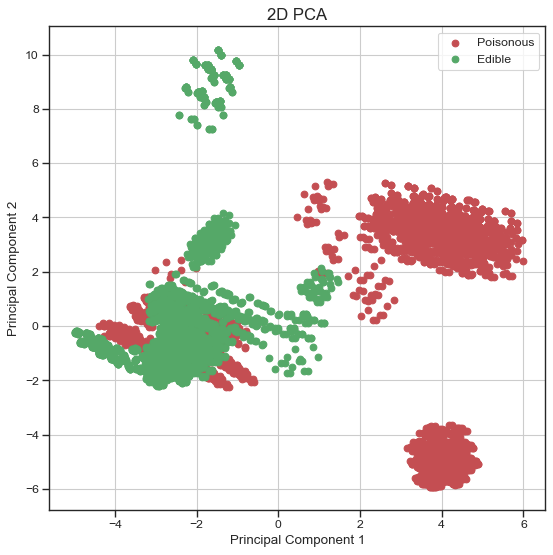

In [16]:
figure(num=None, figsize=(8, 8), dpi=80, facecolor='w', edgecolor='k')

classes = [1, 0]
colors = ['r', 'g']
for clas, color in zip(classes, colors):
    plt.scatter(PCA_df.loc[PCA_df['class'] == clas, 'PC1'], PCA_df.loc[PCA_df['class'] == clas, 'PC2'], c = color)
    
plt.xlabel('Principal Component 1', fontsize = 12)
plt.ylabel('Principal Component 2', fontsize = 12)
plt.title('2D PCA', fontsize = 15)
plt.legend(['Poisonous', 'Edible'])
plt.grid()

In [17]:
pca.explained_variance_ratio_

array([0.08891017, 0.08125474])

In [18]:
complete_test_2D(X_pca, Y, 'PCA')

2.395619
[[1242   32]
 [  90 1074]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1274
           1       0.97      0.92      0.95      1164

    accuracy                           0.95      2438
   macro avg       0.95      0.95      0.95      2438
weighted avg       0.95      0.95      0.95      2438



In [19]:
var_ratio = pca.explained_variance_ratio_
cum_var_ratio = np.cumsum(var_ratio)

trace1 = dict(
    type='bar',
    x=['PC %s' %i for i in range(1,5)],
    y=var_ratio,
    name='Individual'
)

trace2 = dict(
    type='scatter',
    x=['PC %s' %i for i in range(1,5)], 
    y=cum_var_ratio,
    name='Cumulative'
)

data = [trace1, trace2]

layout=dict(
    title='Explained variance Ratio by each principal components',
    yaxis=dict(
        title='Explained variance ratio in percent'
    ),
    annotations=list([
        dict(
            x=1.16,
            y=1.05,
            xref='paper',
            yref='paper',
            showarrow=False,
        )
    ])
)

fig = dict(data=data, layout=layout)
iplot(fig)

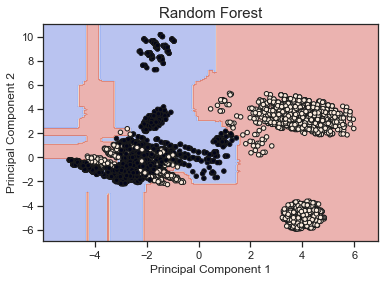

In [20]:
from itertools import product

X_Reduced, X_Test_Reduced, Y_Reduced, Y_Test_Reduced = train_test_split(X_pca, Y, test_size = 0.30, random_state = 101)
trainedforest = RandomForestClassifier(n_estimators=700).fit(X_Reduced,Y_Reduced)

x_min, x_max = X_Reduced[:, 0].min() - 1, X_Reduced[:, 0].max() + 1
y_min, y_max = X_Reduced[:, 1].min() - 1, X_Reduced[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
Z = trainedforest.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z,cmap=plt.cm.coolwarm, alpha=0.4)
plt.scatter(X_Reduced[:, 0], X_Reduced[:, 1], c=Y_Reduced, s=20, edgecolor='k')
plt.xlabel('Principal Component 1', fontsize = 12)
plt.ylabel('Principal Component 2', fontsize = 12)
plt.title('Random Forest', fontsize = 15)
plt.show()

In [21]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)
complete_test_3D(X_pca, Y, 'PCA')

3.533753000000001
[[1261   13]
 [  39 1125]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1274
           1       0.99      0.97      0.98      1164

    accuracy                           0.98      2438
   macro avg       0.98      0.98      0.98      2438
weighted avg       0.98      0.98      0.98      2438



In [22]:
var_ratio = pca.explained_variance_ratio_
cum_var_ratio = np.cumsum(var_ratio)

trace1 = dict(
    type='bar',
    x=['PC %s' %i for i in range(1,5)],
    y=var_ratio,
    name='Individual'
)

trace2 = dict(
    type='scatter',
    x=['PC %s' %i for i in range(1,5)], 
    y=cum_var_ratio,
    name='Cumulative'
)

data = [trace1, trace2]

layout=dict(
    title='Explained variance Ratio by each principal components',
    yaxis=dict(
        title='Explained variance ratio in percent'
    ),
    annotations=list([
        dict(
            x=1.16,
            y=1.05,
            xref='paper',
            yref='paper',
            showarrow=False,
        )
    ])
)

fig = dict(data=data, layout=layout)
iplot(fig)

### t-Distribuido Stochastic Neighbor Embedding (t-SNE)

t-SNE es una tecnica no-lineal de reduccion de dimensionalidad. Funciona minimizando la divergencia (KL) entre las distribuciones conjuntas de los inputs en la dimension orignal del espacio y en la dimension reducida del espacio.

El hyperespacio original es modelado usando una distribucion normal, mientras que el reducido se modela con una t-Student. Esto es para evitar el desbalance en la distribucion de distancias de una vecindad al traducirla a una de dimension inferior.

In [23]:
from sklearn.manifold import TSNE

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
X_tsne = tsne.fit_transform(X)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8124 samples in 0.143s...
[t-SNE] Computed neighbors for 8124 samples in 9.281s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8124
[t-SNE] Computed conditional probabilities for sample 2000 / 8124
[t-SNE] Computed conditional probabilities for sample 3000 / 8124
[t-SNE] Computed conditional probabilities for sample 4000 / 8124
[t-SNE] Computed conditional probabilities for sample 5000 / 8124
[t-SNE] Computed conditional probabilities for sample 6000 / 8124
[t-SNE] Computed conditional probabilities for sample 7000 / 8124
[t-SNE] Computed conditional probabilities for sample 8000 / 8124
[t-SNE] Computed conditional probabilities for sample 8124 / 8124
[t-SNE] Mean sigma: 2.658530
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.730026
[t-SNE] KL divergence after 300 iterations: 2.143593
t-SNE done! Time elapsed: 24.527502059936523 seconds


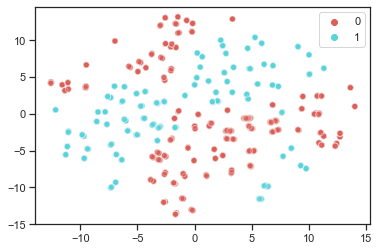

In [24]:
sns.scatterplot(
    x=X_tsne[:,0], y=X_tsne[:,1],
    hue=Y,
    palette=sns.color_palette("hls", 2),
    data=df,
    legend="full",
    alpha=0.3
)

In [25]:
complete_test_2D(X_tsne, Y, 't-SNE')

2.4222430000000017
[[1274    0]
 [   0 1164]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1274
           1       1.00      1.00      1.00      1164

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



In [26]:
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
X_tsne = tsne.fit_transform(X)
complete_test_3D(X_tsne, Y, 't-SNE')

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 8124 samples in 0.125s...
[t-SNE] Computed neighbors for 8124 samples in 8.814s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8124
[t-SNE] Computed conditional probabilities for sample 2000 / 8124
[t-SNE] Computed conditional probabilities for sample 3000 / 8124
[t-SNE] Computed conditional probabilities for sample 4000 / 8124
[t-SNE] Computed conditional probabilities for sample 5000 / 8124
[t-SNE] Computed conditional probabilities for sample 6000 / 8124
[t-SNE] Computed conditional probabilities for sample 7000 / 8124
[t-SNE] Computed conditional probabilities for sample 8000 / 8124
[t-SNE] Computed conditional probabilities for sample 8124 / 8124
[t-SNE] Mean sigma: 2.658530
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.618988
[t-SNE] KL divergence after 300 iterations: 1.905553
2.407938999999999
[[1274    0]
 [   0 1164]]
              precision    recall  f1-score   support

    

### Indipendent Component Analysis (ICA)

ICA es un metodo de reduccion de simensionalidad lineal que interpreta una señal como combinacion de varias fuentes e intenta identificar que parte de la señal completa corresponde a cada una, intentando eliminar el ruido.

In [27]:
from sklearn.decomposition import FastICA

ica = FastICA(n_components=2)
X_ica = ica.fit_transform(X)
print('Original number of features:', X.shape[1])
print('Reduced number of features:', X_ica.shape[1])

Original number of features: 117
Reduced number of features: 2


In [28]:
complete_test_2D(X_ica, Y, 'ICA')

3.7359810000000095
[[1235   39]
 [  92 1072]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1274
           1       0.96      0.92      0.94      1164

    accuracy                           0.95      2438
   macro avg       0.95      0.95      0.95      2438
weighted avg       0.95      0.95      0.95      2438



In [29]:
ica = FastICA(n_components=3)
X_ica = ica.fit_transform(X)

complete_test_3D(X_ica, Y, 'ICA')

3.6998570000000086
[[1264   10]
 [  40 1124]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1274
           1       0.99      0.97      0.98      1164

    accuracy                           0.98      2438
   macro avg       0.98      0.98      0.98      2438
weighted avg       0.98      0.98      0.98      2438



### Topological Data Analysis

In [30]:
import umap
import kmapper as km
import sklearn

In [31]:
mapper = km.KeplerMapper(verbose=0)

X_tda = mapper.fit_transform(X, projection=TSNE(n_components=2, verbose=1, perplexity=8, n_iter=300))

[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 8124 samples in 0.119s...
[t-SNE] Computed neighbors for 8124 samples in 6.365s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8124
[t-SNE] Computed conditional probabilities for sample 2000 / 8124
[t-SNE] Computed conditional probabilities for sample 3000 / 8124
[t-SNE] Computed conditional probabilities for sample 4000 / 8124
[t-SNE] Computed conditional probabilities for sample 5000 / 8124
[t-SNE] Computed conditional probabilities for sample 6000 / 8124
[t-SNE] Computed conditional probabilities for sample 7000 / 8124
[t-SNE] Computed conditional probabilities for sample 8000 / 8124
[t-SNE] Computed conditional probabilities for sample 8124 / 8124
[t-SNE] Mean sigma: 1.726520
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.895508
[t-SNE] KL divergence after 300 iterations: 3.180100


In [32]:
graph = mapper.map(X_tda)
_ = mapper.visualize(graph, color_function=df["class"].map(lambda x: 0 if x=="e" else 1).values,
                     path_html="mushrooms_2d.html")

In [33]:
complete_test_2D(X_tda, Y, 'TDA')

2.3415860000000066
[[1274    0]
 [   0 1164]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1274
           1       1.00      1.00      1.00      1164

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



In [34]:
X_tda = mapper.fit_transform(X, projection=TSNE(n_components=3, verbose=1, perplexity=12, n_iter=300))

[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 8124 samples in 0.123s...
[t-SNE] Computed neighbors for 8124 samples in 7.095s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8124
[t-SNE] Computed conditional probabilities for sample 2000 / 8124
[t-SNE] Computed conditional probabilities for sample 3000 / 8124
[t-SNE] Computed conditional probabilities for sample 4000 / 8124
[t-SNE] Computed conditional probabilities for sample 5000 / 8124
[t-SNE] Computed conditional probabilities for sample 6000 / 8124
[t-SNE] Computed conditional probabilities for sample 7000 / 8124
[t-SNE] Computed conditional probabilities for sample 8000 / 8124
[t-SNE] Computed conditional probabilities for sample 8124 / 8124
[t-SNE] Mean sigma: 2.003597
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.546318
[t-SNE] KL divergence after 300 iterations: 2.558829


In [35]:
complete_test_3D(X_tda, Y, 'TDA')

2.6858840000000157
[[1274    0]
 [   0 1164]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1274
           1       1.00      1.00      1.00      1164

    accuracy                           1.00      2438
   macro avg       1.00      1.00      1.00      2438
weighted avg       1.00      1.00      1.00      2438



### Autoencoders

Los Autoencoders son una familia de algoritmos enfocados en resolver problemas de reduccion de dimensionalidad. La diferencia principal de estos algoritmos con el resto es que proveen un mecanismo no lineal de capturar tendencias tan abstractas en los datos como se quiera.

Existen varios tipos de autoencoders. Principalmente:

- Denoising Autoencoder 
- Variational Autoencoder
- Convolutional Autoencoder
- Sparse Autoencoder

En este ejemplo veremos un Autoencoder basico (sin regularizacion o arquitectura especial). Que reduce los datos originales a 2 dimensiones representativas. Un auto encoder posee dos elementos:

- Encoder: toma los datos y los "comprime" (en el sentido computacional) de manera eficiente, reduciendo el ruido.
- DEcoder: toma la representacion latente de los datos y trata de reducir el sample original.

Si los features originales son independientes, entonces el autoencoder no a poder reducir muy bien todo el contenido informatico en un espacio de dimension inferior.

Aqui usamos ReLu como la funcion de activacion para el "encoding" y Softmax para el "decoding". Esto es importante notarlo, porque si no hubieramos usado funciones no-lineales de activacion entonces el autoencoder hubiera aprendido a reducir usando una transformacion linear (dando un resultado similar al de PCA, por ejemplo).

In [36]:
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

input_layer = Input(shape=(X.shape[1],))
encoded = Dense(2, activation='relu')(input_layer)
decoded = Dense(X.shape[1], activation='softmax')(encoded)
autoencoder = Model(input_layer, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

X1, X2, Y1, Y2 = train_test_split(X, X, test_size=0.3, random_state=101)

autoencoder.fit(X1, Y1,
                epochs=100,
                batch_size=300,
                shuffle=True,
                verbose = 0,
                validation_data=(X2, Y2))

encoder = Model(input_layer, encoded)
X_ae = encoder.predict(X)

In [37]:
complete_test_2D(X_ae, Y, 'AE')

1.4799089999999921
[[1256   18]
 [ 219  945]]
              precision    recall  f1-score   support

           0       0.85      0.99      0.91      1274
           1       0.98      0.81      0.89      1164

    accuracy                           0.90      2438
   macro avg       0.92      0.90      0.90      2438
weighted avg       0.91      0.90      0.90      2438



In [38]:
input_layer = Input(shape=(X.shape[1],))
encoded = Dense(3, activation='relu')(input_layer)
decoded = Dense(X.shape[1], activation='softmax')(encoded)
autoencoder = Model(input_layer, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

X1, X2, Y1, Y2 = train_test_split(X, X, test_size=0.3, random_state=101)

autoencoder.fit(X1, Y1,
                epochs=100,
                batch_size=300,
                shuffle=True,
                verbose = 0,
                validation_data=(X2, Y2))

encoder = Model(input_layer, encoded)
X_ae = encoder.predict(X)

In [39]:
complete_test_3D(X_ae, Y, 'AE')

1.9905469999999923
[[1152  122]
 [ 107 1057]]
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      1274
           1       0.90      0.91      0.90      1164

    accuracy                           0.91      2438
   macro avg       0.91      0.91      0.91      2438
weighted avg       0.91      0.91      0.91      2438

